# Init-scale 0.1 multi-sparsity analysis

Analysis of the **init_scale=0.1** two-module RNN (25 hidden, nb_steps=2) runs across **sparsity** (no_comms, 0.3, 0.5, 0.7, 0.9) and **routing** (shared vs task_routed).

**Focus:**
- **Transfer interference** (error_diff: initial B − final A1)
- **Accuracy** (per phase: post_A, post_B, post_A2)
- **Loss** (per phase)
- **PCA geometry** (dimensionality, 2D PC1–PC2, combined/core/comms)

Run this notebook after the corresponding simulations have finished training.

In [1]:
# 1. Setup and configuration

import sys
import os
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

project_root = Path(os.getcwd()).resolve()
while not (project_root / "a1b2").exists():
    if project_root == project_root.parent:
        raise RuntimeError("Project root (containing a1b2) not found.")
    project_root = project_root.parent
sys.path.insert(0, str(project_root))
os.chdir(project_root)

from a1b2.utils.run_config import build_run_id
from a1b2.analysis import transfer_interference as ann
from a1b2.analysis.transfer_interference import prepare_pca_single_task
from a1b2.utils.figure_settings import task_colours
from a1b2.utils.figure_utils import plot_split_stim, get_axis_limits

data_folder = project_root / "data"
sim_folder = data_folder / "simulations"
config_path = project_root / "a1b2" / "models" / "experiments.json"
with open(config_path, "r") as f:
    settings = json.load(f)

print("Project root:", project_root)
print("Simulations folder:", sim_folder)

Project root: /home/kat/workspace/Structure-Function-Analysis-of-Network-Topologies/a1b2_modular
Simulations folder: /home/kat/workspace/Structure-Function-Analysis-of-Network-Topologies/a1b2_modular/data/simulations


In [2]:
# 2. Select init_scale=0.1 runs: no_comms, 0.3, 0.5, 0.7, 0.9 × shared & task_routed

INIT01_NAMES = [
    "two_module_rnn_25_no_comms_nb2_init0.1",
    "two_module_rnn_25_task_routed_no_comms_nb2_init0.1",
    "two_module_rnn_25_low_sparse_nb2_init0.1",
    "two_module_rnn_25_task_routed_low_sparse_nb2_init0.1",
    "two_module_rnn_25_sp05_nb2_init0.1",
    "two_module_rnn_25_task_routed_sp05_nb2_init0.1",
    "two_module_rnn_25_sp07_nb2_init0.1",
    "two_module_rnn_25_task_routed_sp07_nb2_init0.1",
    "two_module_rnn_25_sp09_nb2_init0.1",
    "two_module_rnn_25_task_routed_sp09_nb2_init0.1",
]

name_to_condition = {c["name"]: c for c in settings["conditions"] if c.get("name")}
rows = []
for name in INIT01_NAMES:
    c = name_to_condition.get(name)
    if c is None:
        continue
    run_id = build_run_id(c)
    path = sim_folder / run_id
    sp = c.get("sparsity", 1.0)
    routing = c.get("input_routing", "shared")
    sp_label = "no_comms" if (sp == 0 or "no_comms" in name) else str(sp)
    rows.append({
        "name": name,
        "run_id": run_id,
        "init_scale": 0.1,
        "sparsity": sp,
        "sparsity_label": sp_label,
        "input_routing": routing,
        "path_exists": path.exists(),
        "path": str(path),
    })

run_table = pd.DataFrame(rows)
valid = run_table[run_table["path_exists"]].copy()
display(run_table)
print("Valid runs (path exists):", len(valid))

,name,run_id,init_scale,sparsity,sparsity_label,input_routing,path_exists,path
0,two_module_rnn_25_no_comms_nb2_init0.1,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,0.0,no_comms,shared,True,/home/kat/workspace/Structure-Function-Analysi...
1,two_module_rnn_25_task_routed_no_comms_nb2_ini...,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.1,0.0,no_comms,task_routed,True,/home/kat/workspace/Structure-Function-Analysi...
2,two_module_rnn_25_low_sparse_nb2_init0.1,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.1,0.3,0.3,shared,True,/home/kat/workspace/Structure-Function-Analysi...
3,two_module_rnn_25_task_routed_low_sparse_nb2_i...,two_module_rnn_25_task_routed_low_sparse_nb2_i...,0.1,0.3,0.3,task_routed,True,/home/kat/workspace/Structure-Function-Analysi...
4,two_module_rnn_25_sp05_nb2_init0.1,two_module_rnn_25_sp05_nb2_init0.1_nb2_shared_...,0.1,0.5,0.5,shared,True,/home/kat/workspace/Structure-Function-Analysi...
5,two_module_rnn_25_task_routed_sp05_nb2_init0.1,two_module_rnn_25_task_routed_sp05_nb2_init0.1...,0.1,0.5,0.5,task_routed,True,/home/kat/workspace/Structure-Function-Analysi...
6,two_module_rnn_25_sp07_nb2_init0.1,two_module_rnn_25_sp07_nb2_init0.1_nb2_shared_...,0.1,0.7,0.7,shared,True,/home/kat/workspace/Structure-Function-Analysi...
7,two_module_rnn_25_task_routed_sp07_nb2_init0.1,two_module_rnn_25_task_routed_sp07_nb2_init0.1...,0.1,0.7,0.7,task_routed,True,/home/kat/workspace/Structure-Function-Analysi...
8,two_module_rnn_25_sp09_nb2_init0.1,two_module_rnn_25_sp09_nb2_init0.1_nb2_shared_...,0.1,0.9,0.9,shared,True,/home/kat/workspace/Structure-Function-Analysi...
9,two_module_rnn_25_task_routed_sp09_nb2_init0.1,two_module_rnn_25_task_routed_sp09_nb2_init0.1...,0.1,0.9,0.9,task_routed,True,/home/kat/workspace/Structure-Function-Analysi...


Valid runs (path exists): 10


In [3]:
# 3. Load ANN data for valid runs

all_ann_data = {}
for _, row in valid.iterrows():
    run_id = row["run_id"]
    path = Path(row["path"])
    ann_data = ann.load_ann_data(str(path), load_rnn_extra=True)
    if len(ann_data.get("same", [])) > 0 and len(ann_data.get("near", [])) > 0 and len(ann_data.get("far", [])) > 0:
        all_ann_data[run_id] = {
            "data": ann_data,
            "init_scale": row["init_scale"],
            "sparsity": row["sparsity"],
            "sparsity_label": row["sparsity_label"],
            "input_routing": row["input_routing"],
        }

run_labels = list(all_ann_data.keys())
print("Loaded", len(run_labels), "runs with all three schedules (same/near/far).")
for rid in run_labels:
    b = all_ann_data[rid]
    d = b["data"]
    print(f"  {b['sparsity_label']} {b['input_routing']}: same={len(d['same'])} near={len(d['near'])} far={len(d['far'])}")

Loaded 10 runs with all three schedules (same/near/far).
  no_comms shared: same=103 near=101 far=101
  no_comms task_routed: same=103 near=101 far=101
  0.3 shared: same=103 near=101 far=101
  0.3 task_routed: same=103 near=101 far=101
  0.5 shared: same=103 near=101 far=101
  0.5 task_routed: same=103 near=101 far=101
  0.7 shared: same=103 near=101 far=101
  0.7 task_routed: same=103 near=101 far=101
  0.9 shared: same=103 near=101 far=101
  0.9 task_routed: same=103 near=101 far=101


In [4]:
# 4. Compute per-participant metrics: transfer, accuracy, loss, representation

transfer_records = []
accuracy_records = []
loss_records = []
rep_records = []

for run_id in run_labels:
    bundle = all_ann_data[run_id]
    ann_data = bundle["data"]
    sparsity = bundle["sparsity"]
    sp_label = bundle["sparsity_label"]
    routing = bundle["input_routing"]
    init_scale = bundle["init_scale"]

    for cond_name, entries in ann_data.items():
        for entry in entries:
            pid = str(entry["participant"])
            cond_idx = ["same", "near", "far"].index(cond_name) if cond_name in ["same", "near", "far"] else 0

            # Transfer (error_diff)
            acc = np.asarray(entry["accuracy"])
            acc_cond = acc[cond_idx] if acc.ndim == 3 else acc
            if acc_cond.ndim >= 2 and acc_cond.shape[0] >= 2:
                A1_acc = acc_cond[0, 1::2] if acc_cond.ndim == 2 else np.asarray(acc_cond[0]).flatten()[1::2]
                B_acc = acc_cond[1, 1::2] if acc_cond.ndim == 2 else np.asarray(acc_cond[1]).flatten()[1::2]
                if len(A1_acc) >= 6 and len(B_acc) >= 6:
                    final_A1 = float(np.mean(A1_acc[-6:]))
                    init_B = float(np.mean(B_acc[:6]))
                    transfer_records.append({
                        "run_id": run_id, "init_scale": init_scale, "condition": cond_name,
                        "sparsity": sparsity, "sparsity_label": sp_label, "input_routing": routing,
                        "participant": pid, "error_diff": init_B - final_A1,
                    })

            # Accuracy per phase
            if acc.size > 0:
                n_ph = acc_cond.shape[0]
                for ph in range(min(3, n_ph)):
                    phase_name = ["post_A", "post_B", "post_A2"][ph]
                    mean_acc = float(np.nanmean(acc_cond[ph]))
                    accuracy_records.append({
                        "run_id": run_id, "condition": cond_name, "sparsity_label": sp_label,
                        "input_routing": routing, "participant": pid, "phase": phase_name, "mean_accuracy": mean_acc,
                    })

            # Loss per phase
            losses = entry.get("losses")
            if losses is not None:
                loss_arr = np.asarray(losses)
                loss_cond = loss_arr[cond_idx] if loss_arr.ndim == 3 else loss_arr
                n_ph = loss_cond.shape[0]
                for ph in range(min(3, n_ph)):
                    phase_name = ["post_A", "post_B", "post_A2"][ph]
                    mean_loss = float(np.nanmean(loss_cond[ph]))
                    loss_records.append({
                        "run_id": run_id, "condition": cond_name, "sparsity_label": sp_label,
                        "input_routing": routing, "participant": pid, "phase": phase_name, "mean_loss": mean_loss,
                    })

            # Representation metrics (combined/core/comms)
            for phase_idx, phase_name in [(0, "post_A"), (1, "post_B"), (2, "post_A2")]:
                if f"hiddens_post_phase_{phase_idx}" not in entry:
                    continue
                for path in ("combined", "core", "comms"):
                    try:
                        hids = ann._get_last_step_geometry_hids(entry, phase_idx, path=path)
                    except (KeyError, ValueError):
                        continue
                    metrics = ann.compute_state_representation_metrics(hids, variance_thresholds=(0.95, 0.99), top_k=2)
                    row = {
                        "run_id": run_id, "init_scale": init_scale, "condition": cond_name,
                        "sparsity_label": sp_label, "input_routing": routing, "participant": pid,
                        "phase": phase_name, "pathway": path, "var_topk": metrics["var_topk"],
                    }
                    for thr, n in metrics["n_components"].items():
                        row[f"n_pcs_{int(thr*100)}"] = n
                    rep_records.append(row)

transfer_df = pd.DataFrame(transfer_records)
accuracy_df = pd.DataFrame(accuracy_records)
loss_df = pd.DataFrame(loss_records)
rep_df = pd.DataFrame(rep_records)

print("transfer_df:", transfer_df.shape)
print("accuracy_df:", accuracy_df.shape)
print("loss_df:", loss_df.shape)
print("rep_df:", rep_df.shape)
display(transfer_df.head(), accuracy_df.head(), rep_df.head())

transfer_df: (3050, 8)
accuracy_df: (9150, 7)
loss_df: (9150, 7)
rep_df: (27450, 11)


,run_id,init_scale,condition,sparsity,sparsity_label,input_routing,participant,error_diff
0,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,0.0,no_comms,shared,sim_study2_same_sub9,-0.461800
1,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,0.0,no_comms,shared,sim_study1_same_sub58,-0.478667
2,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,0.0,no_comms,shared,sim_study2_same_sub32,-0.467203
3,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,0.0,no_comms,shared,sim_study1_same_sub9,-0.500705
4,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,0.0,no_comms,shared,sim_study1_same_sub40,-0.516786


,run_id,condition,sparsity_label,input_routing,participant,phase,mean_accuracy
0,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,same,no_comms,shared,sim_study2_same_sub9,post_A,0.954368
1,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,same,no_comms,shared,sim_study2_same_sub9,post_B,0.997955
2,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,same,no_comms,shared,sim_study2_same_sub9,post_A2,0.996451
3,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,same,no_comms,shared,sim_study1_same_sub58,post_A,0.943951
4,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,same,no_comms,shared,sim_study1_same_sub58,post_B,0.997441


,run_id,init_scale,condition,sparsity_label,input_routing,participant,phase,pathway,var_topk,n_pcs_95,n_pcs_99
0,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,no_comms,shared,sim_study2_same_sub9,post_A,combined,0.997043,2,2
1,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,no_comms,shared,sim_study2_same_sub9,post_A,core,0.997605,2,2
2,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,no_comms,shared,sim_study2_same_sub9,post_A,comms,0.996260,2,2
3,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,no_comms,shared,sim_study2_same_sub9,post_B,combined,0.998232,2,2
4,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,0.1,same,no_comms,shared,sim_study2_same_sub9,post_B,core,0.998648,2,2


## 5. Transfer interference

**Metric:** error_diff = mean(initial B accuracy) − mean(final A1 accuracy). Higher = more transfer (worse A1→B transition).

,run_id,sparsity_label,input_routing,condition,error_diff_mean,error_diff_std
0,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,far,-0.607289,0.094929
1,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,near,-0.472017,0.035334
2,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,same,-0.459937,0.049317
3,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,no_comms,shared,far,-0.605992,0.094372
4,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,no_comms,shared,near,-0.473113,0.034786
5,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,no_comms,shared,same,-0.461256,0.048447
6,two_module_rnn_25_sp05_nb2_init0.1_nb2_shared_...,0.5,shared,far,-0.608146,0.095264
7,two_module_rnn_25_sp05_nb2_init0.1_nb2_shared_...,0.5,shared,near,-0.471267,0.035766
8,two_module_rnn_25_sp05_nb2_init0.1_nb2_shared_...,0.5,shared,same,-0.459105,0.049927
9,two_module_rnn_25_sp07_nb2_init0.1_nb2_shared_...,0.7,shared,far,-0.609034,0.095595


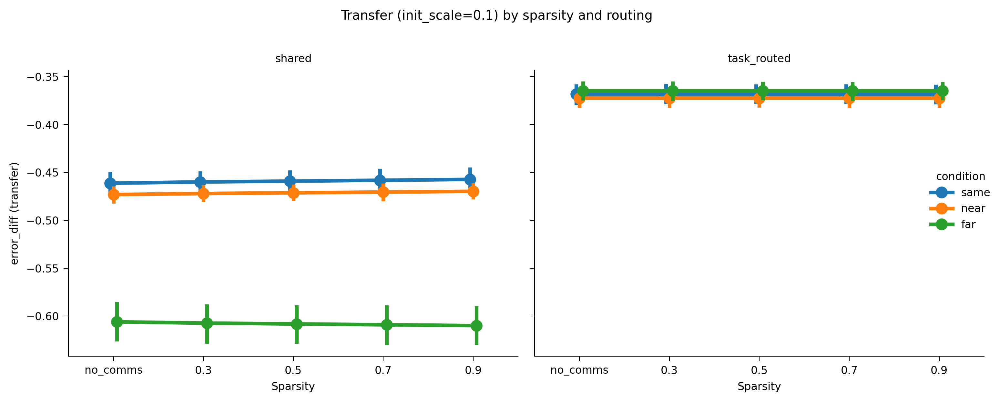

In [5]:
if not transfer_df.empty:
    transfer_summary = (
        transfer_df.groupby(["run_id", "sparsity_label", "input_routing", "condition"], as_index=False)
        .agg({"error_diff": ["mean", "std"]})
    )
    transfer_summary.columns = ["run_id", "sparsity_label", "input_routing", "condition", "error_diff_mean", "error_diff_std"]
    display(transfer_summary)

    # Plot: error_diff vs sparsity, hue=condition, col=routing
    sp_order = ["no_comms", "0.3", "0.5", "0.7", "0.9"]
    sp_order = [s for s in sp_order if s in transfer_df["sparsity_label"].values]
    g = sns.catplot(
        data=transfer_df, x="sparsity_label", y="error_diff", hue="condition",
        col="input_routing", kind="point", dodge=True, height=4, aspect=1.2,
        order=sp_order or transfer_df["sparsity_label"].unique(),
        hue_order=["same", "near", "far"],
    )
    g.set_axis_labels("Sparsity", "error_diff (transfer)")
    g.set_titles("{col_name}")
    g.fig.suptitle("Transfer (init_scale=0.1) by sparsity and routing", y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("No transfer data.")

## 6. Accuracy

Mean accuracy per phase (post_A, post_B, post_A2) by run and condition.

phase                                                           post_A  \
run_id                                             condition             
two_module_rnn_25_low_sparse_nb2_init0.1_nb2_sh... far        0.952391   
                                                   near       0.952322   
                                                   same       0.952356   
two_module_rnn_25_no_comms_nb2_init0.1_nb2_shar... far        0.952277   
                                                   near       0.952204   
                                                   same       0.952243   
two_module_rnn_25_sp05_nb2_init0.1_nb2_shared_s... far        0.952467   
                                                   near       0.952396   
                                                   same       0.952431   
two_module_rnn_25_sp07_nb2_init0.1_nb2_shared_s... far        0.952542   

phase                                                          post_A2  \
run_id                                             condition             
two_module_rnn_25_low_sparse_nb2_init0.1_nb2_sh... far        0.985391   
                                                   near       0.939703   
                                                   same       0.992222   
two_module_rnn_25_no_comms_nb2_init0.1_nb2_shar... far        0.985461   
                                                   near       0.939929   
                                                   same       0.992160   
two_module_rnn_25_sp05_nb2_init0.1_nb2_shared_s... far        0.985349   
                                                   near       0.939562   
                                                   same       0.992266   
two_module_rnn_25_sp07_nb2_init0.1_nb2_shared_s... far        0.985261   

phase                                                           post_B  
run_id                                             condition            
two_module_rnn_25_low_sparse_nb2_init0.1_nb2_sh... far        0.964117  
                                                   near       0.994624  
                                                   same       0.997980  
two_module_rnn_25_no_comms_nb2_init0.1_nb2_shar... far        0.964180  
                                                   near       0.994521  
                                                   same       0.997945  
two_module_rnn_25_sp05_nb2_init0.1_nb2_shared_s... far        0.964074  
                                                   near       0.994691  
                                                   same       0.998004  
two_module_rnn_25_sp07_nb2_init0.1_nb2_shared_s... far        0.964037

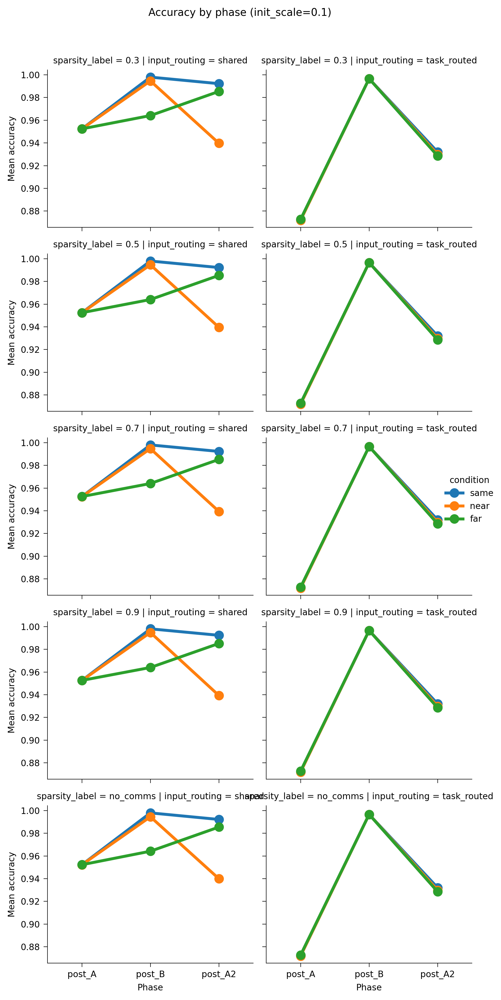

In [6]:
if not accuracy_df.empty:
    acc_summary = (
        accuracy_df.groupby(["run_id", "sparsity_label", "input_routing", "condition", "phase"], as_index=False)
        ["mean_accuracy"].mean()
    )
    display(acc_summary.pivot_table(index=["run_id", "condition"], columns="phase", values="mean_accuracy").head(10))

    # Plot: mean accuracy vs phase, by sparsity and routing
    acc_agg = accuracy_df.groupby(["sparsity_label", "input_routing", "condition", "phase"], as_index=False)["mean_accuracy"].mean()
    phase_order = ["post_A", "post_B", "post_A2"]
    g = sns.catplot(
        data=acc_agg, x="phase", y="mean_accuracy", hue="condition", col="input_routing", row="sparsity_label",
        kind="point", order=phase_order, hue_order=["same", "near", "far"], height=2.5, aspect=1.1,
    )
    g.set_axis_labels("Phase", "Mean accuracy")
    g.fig.suptitle("Accuracy by phase (init_scale=0.1)", y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("No accuracy data.")

## 7. Loss

Mean loss per phase.

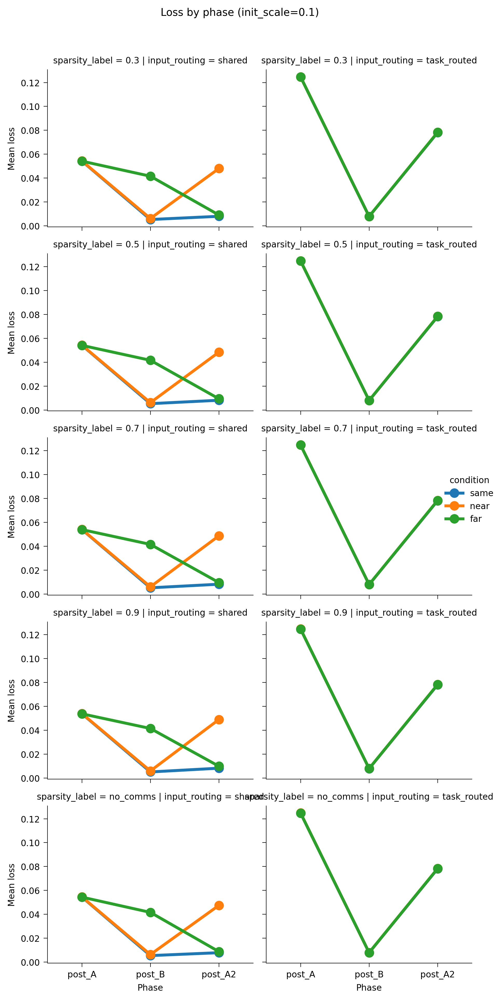

In [7]:
if not loss_df.empty:
    loss_agg = loss_df.groupby(["sparsity_label", "input_routing", "condition", "phase"], as_index=False)["mean_loss"].mean()
    phase_order = ["post_A", "post_B", "post_A2"]
    g = sns.catplot(
        data=loss_agg, x="phase", y="mean_loss", hue="condition", col="input_routing", row="sparsity_label",
        kind="point", order=phase_order, hue_order=["same", "near", "far"], height=2.5, aspect=1.1,
    )
    g.set_axis_labels("Phase", "Mean loss")
    g.fig.suptitle("Loss by phase (init_scale=0.1)", y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("No loss data.")

## 8. PCA geometry

Dimensionality (n_pcs for 95% / 99% variance) and 2D PCA (PC1–PC2) of post-A2 combined hiddens.

,run_id,sparsity_label,input_routing,condition,phase,pathway,var_topk,n_pcs_95,n_pcs_99
3,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,far,post_A2,combined,0.555733,4.0,4.000000
4,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,far,post_A2,comms,0.549959,4.0,4.000000
5,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,far,post_A2,core,0.562768,4.0,4.000000
12,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,near,post_A2,combined,0.995440,2.0,2.019802
13,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,near,post_A2,comms,0.994364,2.0,2.039604
14,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,near,post_A2,core,0.996059,2.0,2.009901
21,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,same,post_A2,combined,0.996530,2.0,2.000000
22,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,same,post_A2,comms,0.995726,2.0,2.019417
23,two_module_rnn_25_low_sparse_nb2_init0.1_nb2_s...,0.3,shared,same,post_A2,core,0.996944,2.0,2.000000
30,two_module_rnn_25_no_comms_nb2_init0.1_nb2_sha...,no_comms,shared,far,post_A2,combined,0.555007,4.0,4.000000


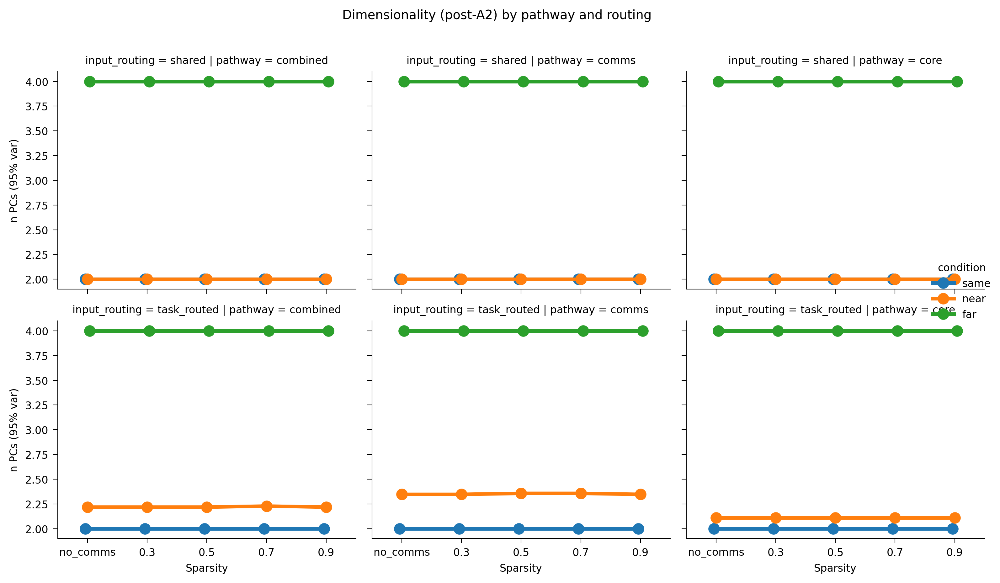

In [8]:
if not rep_df.empty:
    agg_dict = {c: "mean" for c in ["var_topk", "n_pcs_95", "n_pcs_99"] if c in rep_df.columns}
    rep_summary = rep_df.groupby(["run_id", "sparsity_label", "input_routing", "condition", "phase", "pathway"], as_index=False).agg(agg_dict)

    display(rep_summary[rep_summary["phase"] == "post_A2"].head(15))

    # Dimensionality: n_pcs_95 vs sparsity, hue=condition, col=pathway, row=routing
    if "n_pcs_95" in rep_summary.columns:
        sub = rep_summary[rep_summary["phase"] == "post_A2"]
        sp_order_rep = ["no_comms", "0.3", "0.5", "0.7", "0.9"]
        sp_order_rep = [s for s in sp_order_rep if s in sub["sparsity_label"].values]
        g = sns.catplot(
            data=sub, x="sparsity_label", y="n_pcs_95", hue="condition", col="pathway", row="input_routing",
            kind="point", dodge=True, order=sp_order_rep or sub["sparsity_label"].unique(),
            hue_order=["same", "near", "far"], height=3, aspect=1.1,
        )
        g.set_axis_labels("Sparsity", "n PCs (95% var)")
        g.fig.suptitle("Dimensionality (post-A2) by pathway and routing", y=1.02)
        plt.tight_layout()
        plt.show()
else:
    rep_summary = pd.DataFrame()
    print("No representation data.")

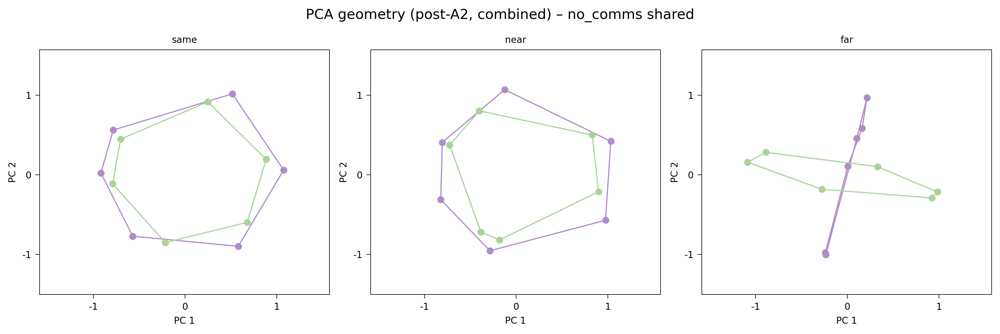

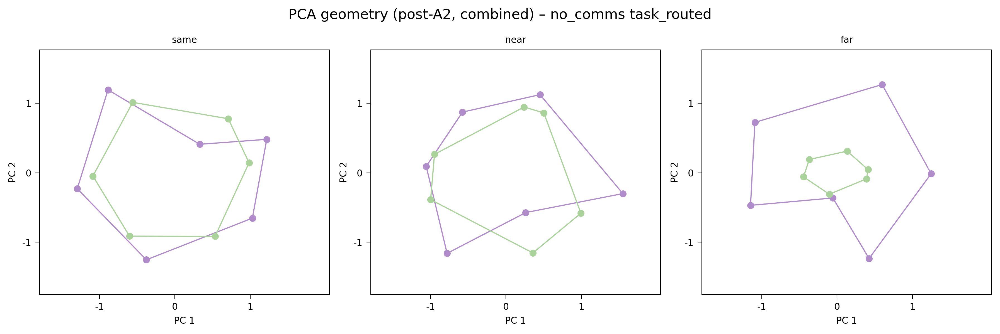

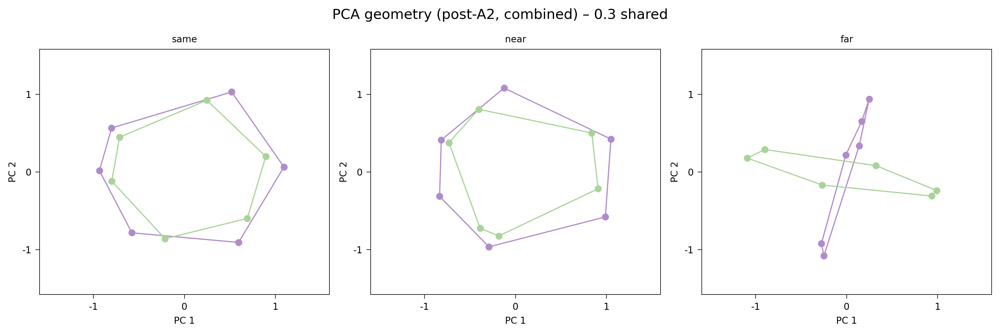

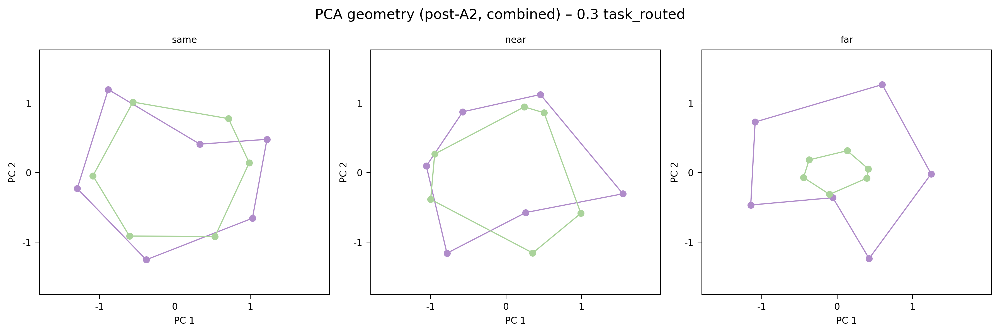

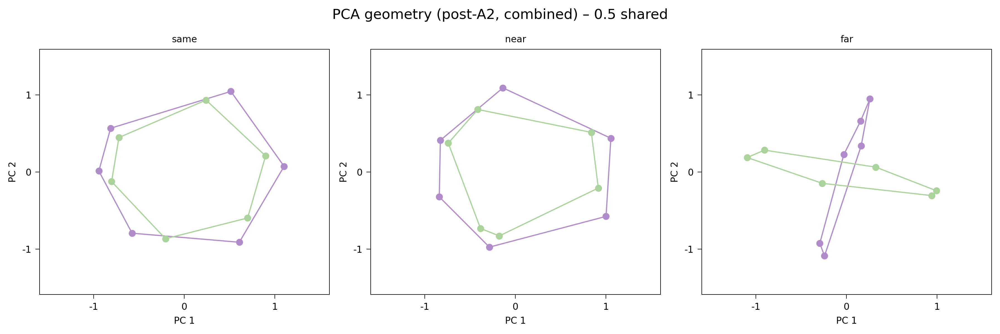

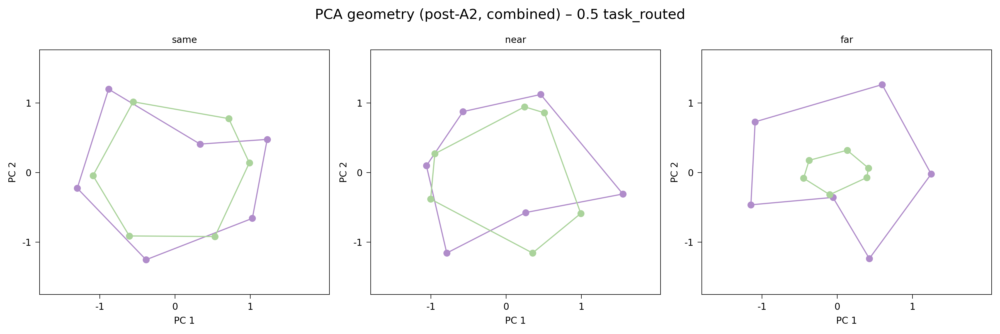

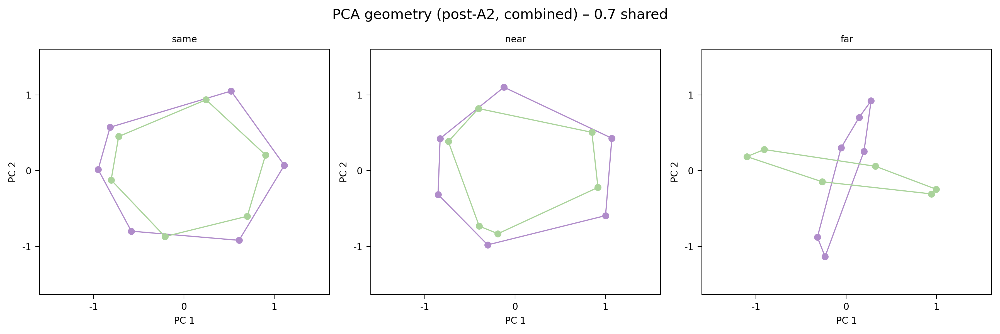

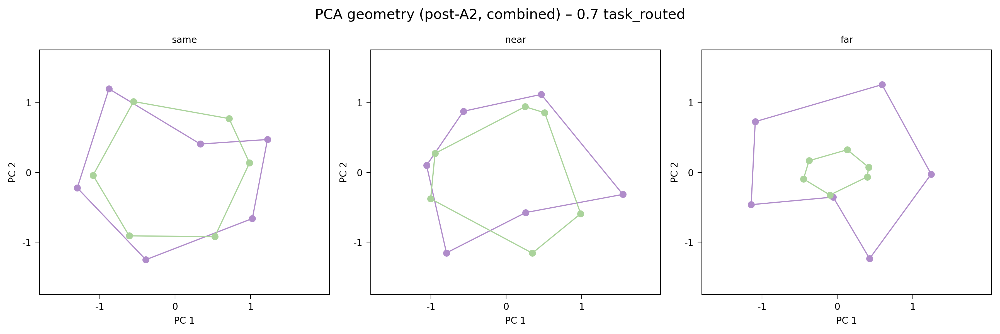

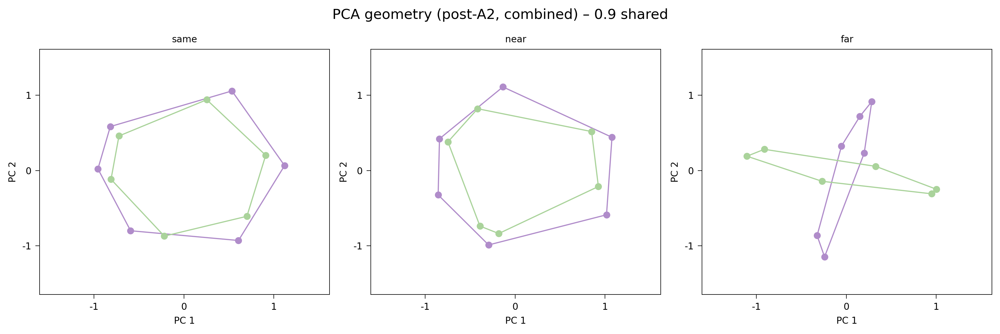

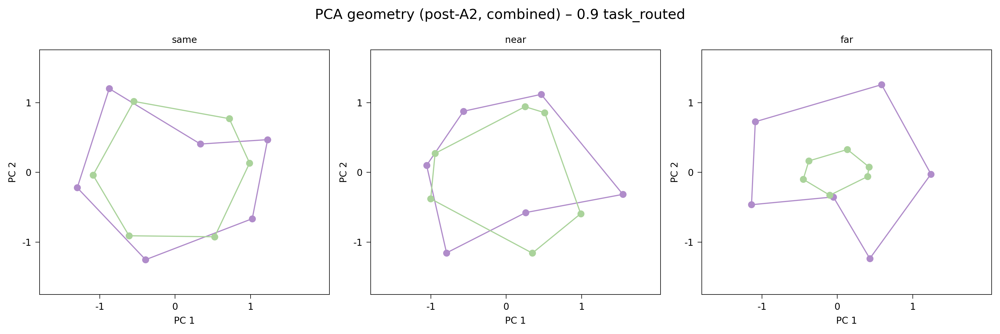

In [9]:
# 9. 2D PCA geometry (PC1–PC2, post-A2 combined): one figure per run

phase_idx = 2
n_stim_plot = 12

for run_id in run_labels:
    bundle = all_ann_data[run_id]
    ann_data = bundle["data"]
    sp_label = bundle["sparsity_label"]
    routing = bundle["input_routing"]

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    fig.suptitle(f"PCA geometry (post-A2, combined) – {sp_label} {routing}", fontsize=12)

    all_2d = []
    for cond in ["same", "near", "far"]:
        entries = ann_data.get(cond, [])
        if not entries:
            all_2d.append(None)
            continue
        entry = entries[0]
        hids = np.asarray(entry.get(f"hiddens_post_phase_{phase_idx}"))
        if hids is None or hids.size == 0 or hids.shape[0] < n_stim_plot:
            all_2d.append(None)
            continue
        hids = hids[:n_stim_plot]
        _, X2 = prepare_pca_single_task(hids)
        all_2d.append(X2)

    valid = [x for x in all_2d if x is not None]
    lims_global = get_axis_limits(np.vstack(valid)) if valid else {}

    for ax, cond, X2 in zip(axes, ["same", "near", "far"], all_2d):
        if X2 is None:
            ax.set_title(f"{cond}\n(no data)")
            ax.axis("off")
            continue
        plot_split_stim(ax, X2, task_colours, lims_global)
        ax.set_title(cond)
    plt.tight_layout()
    plt.show()

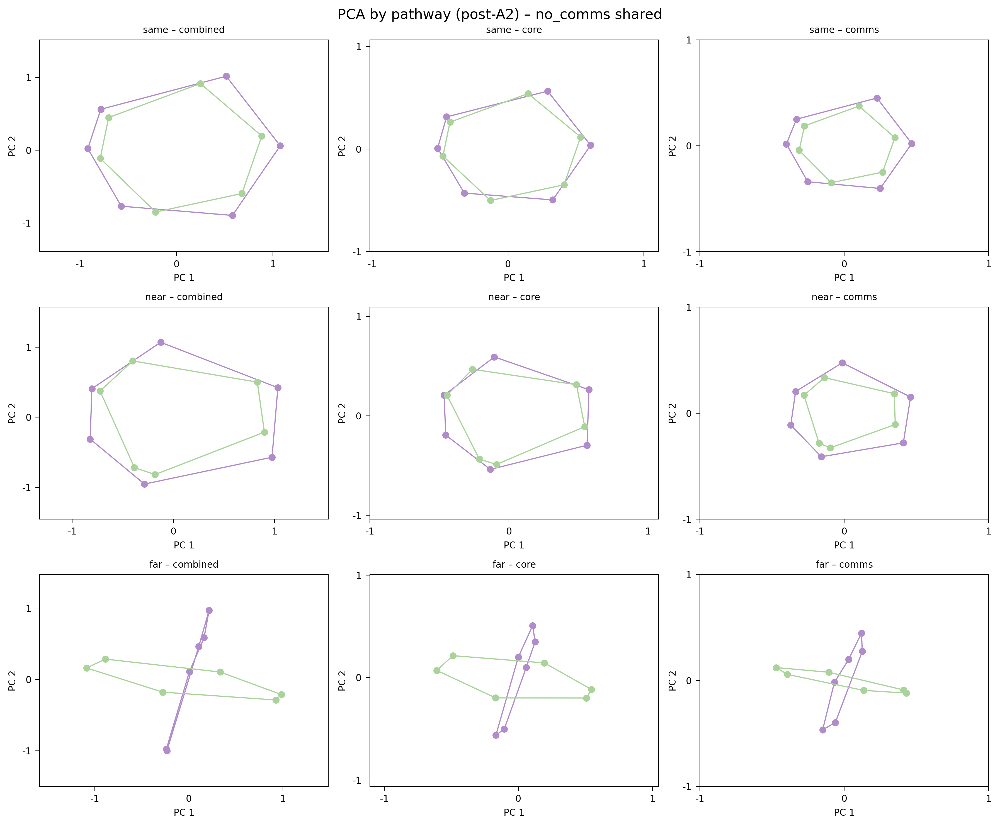

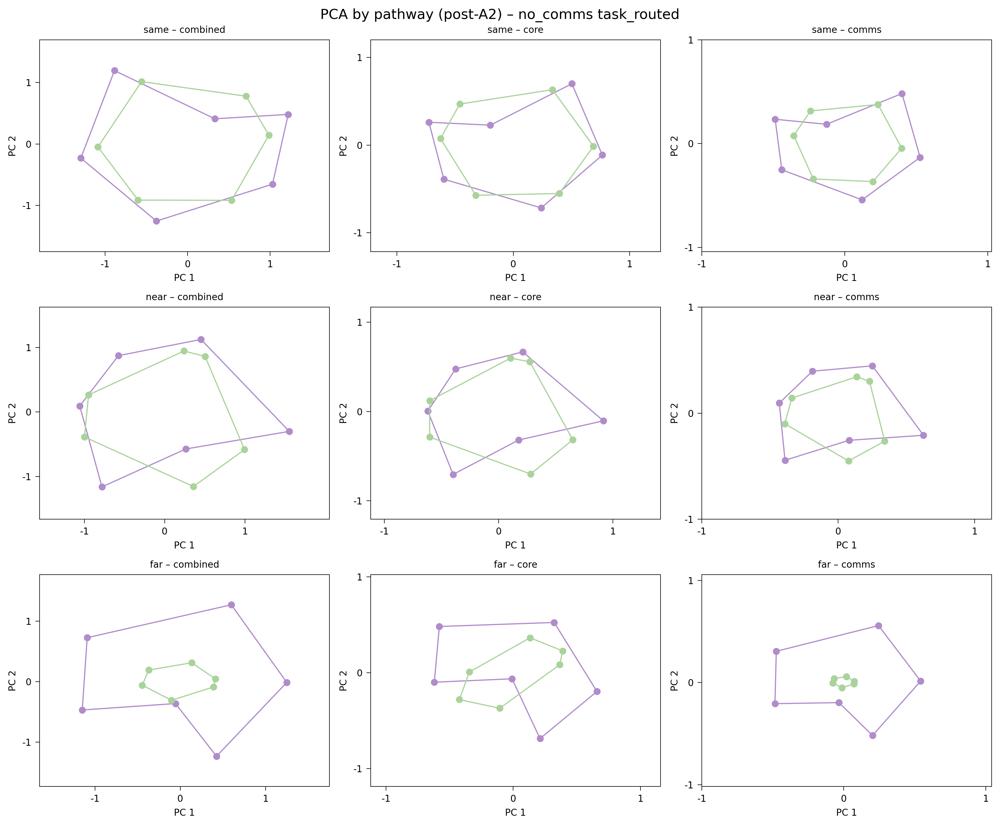

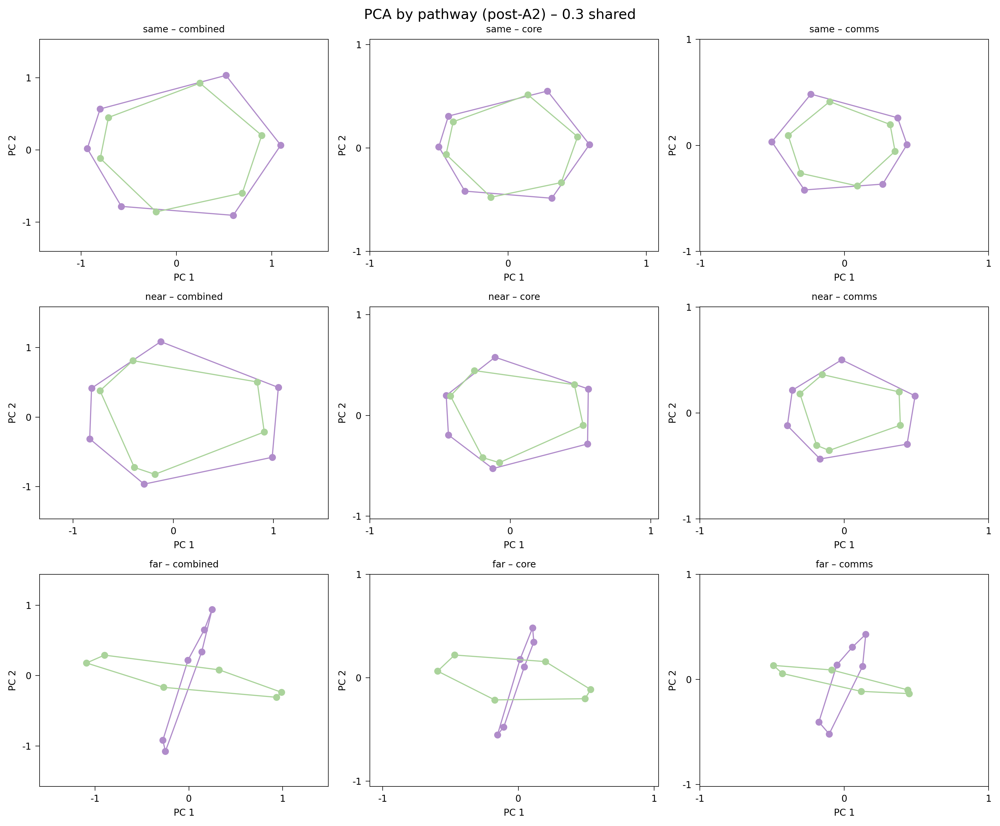

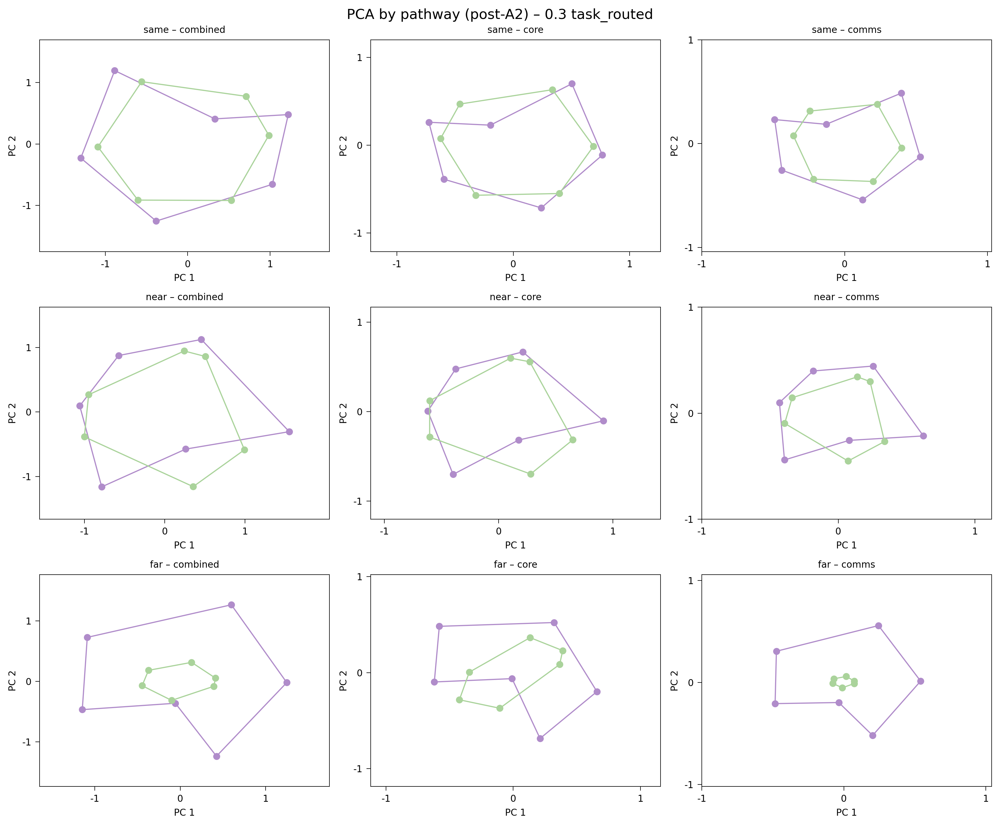

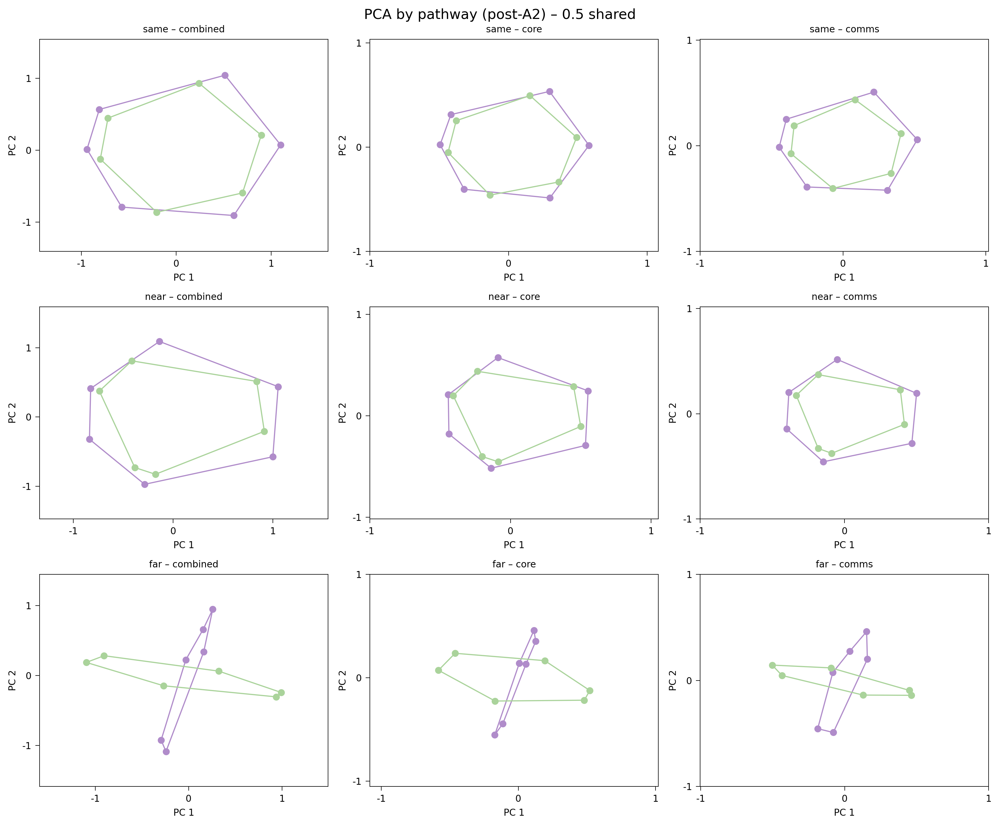

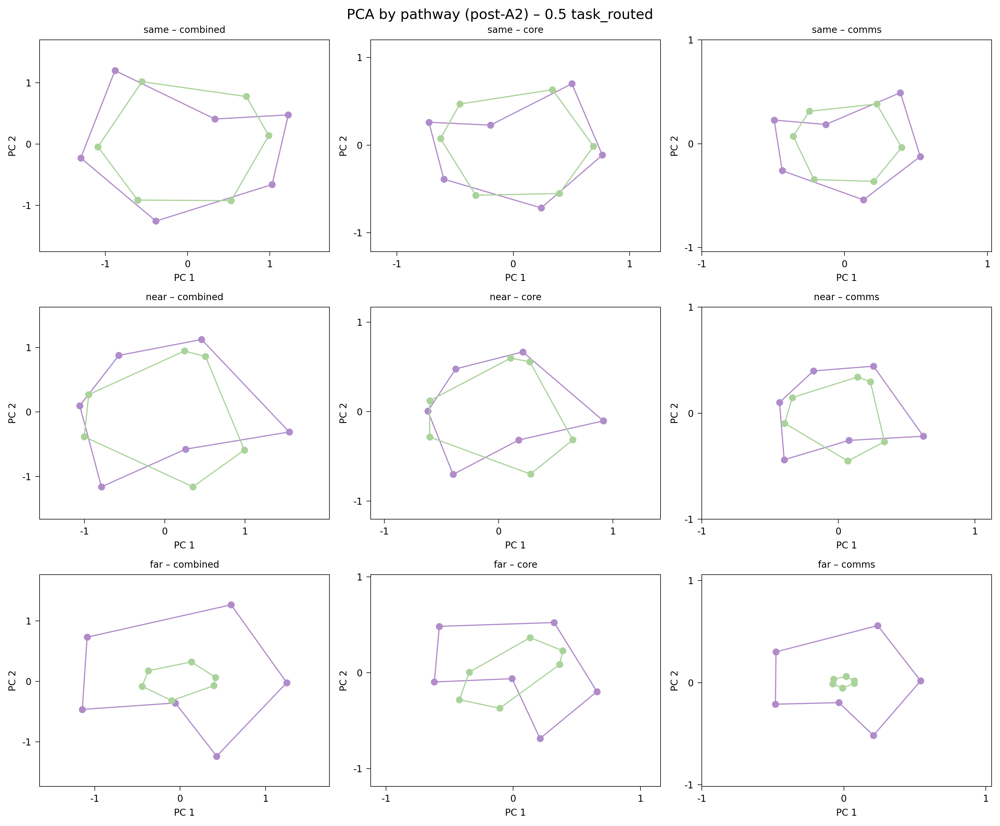

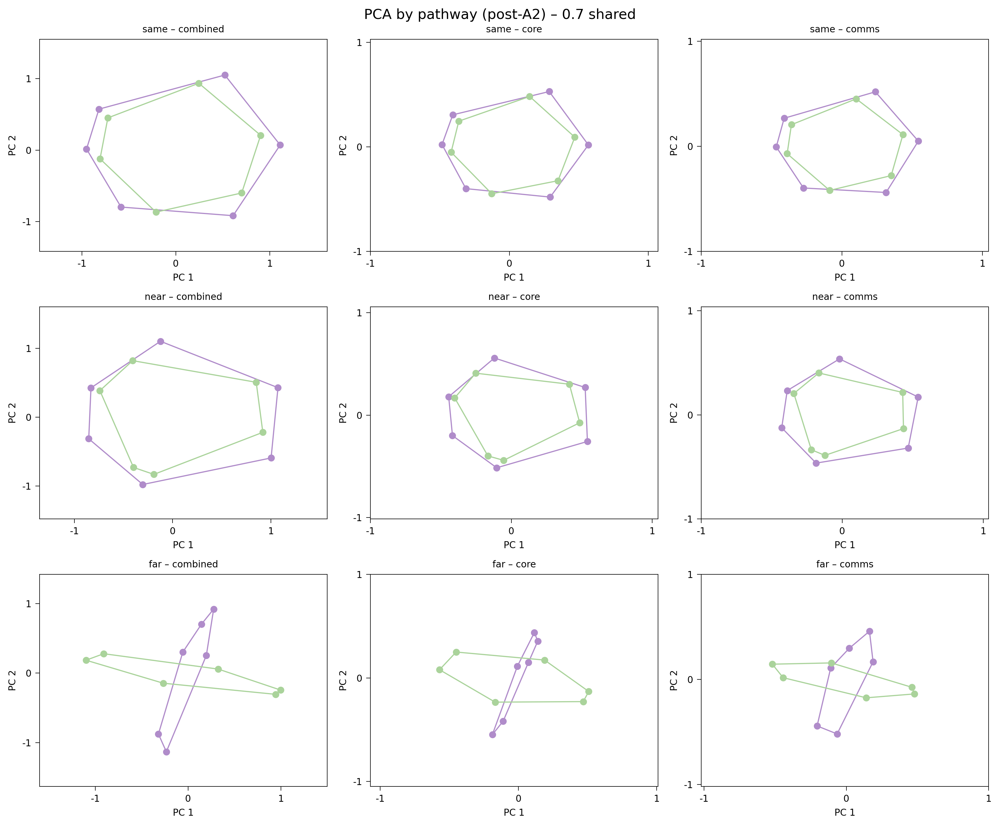

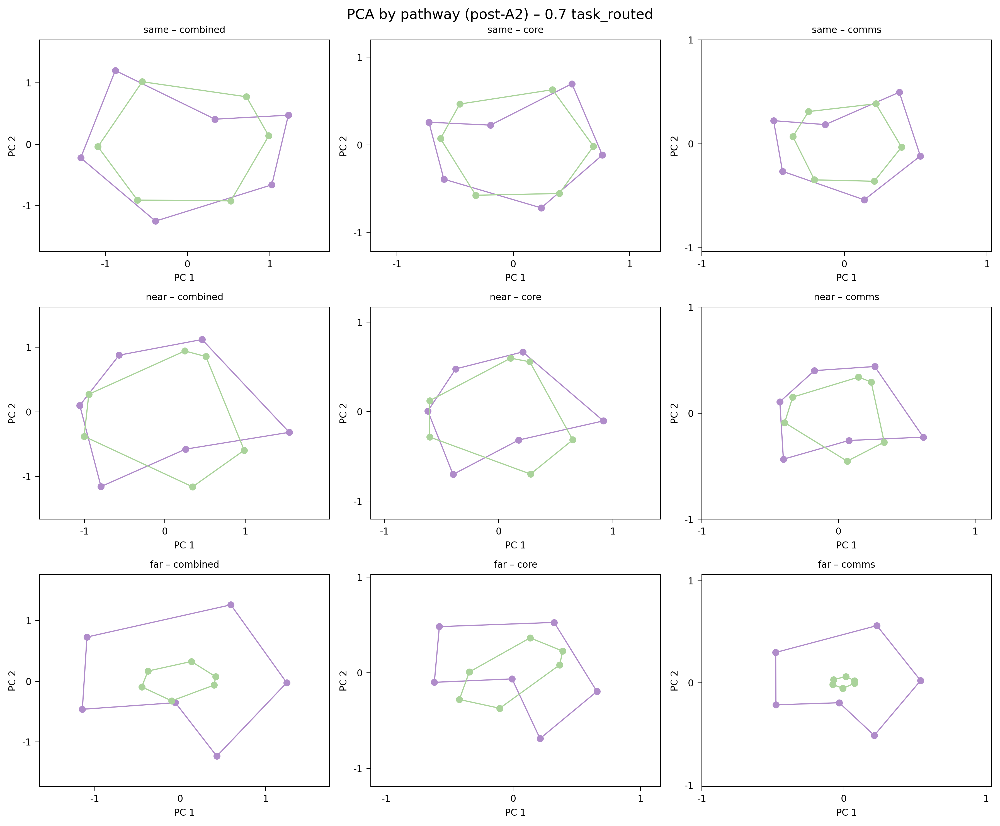

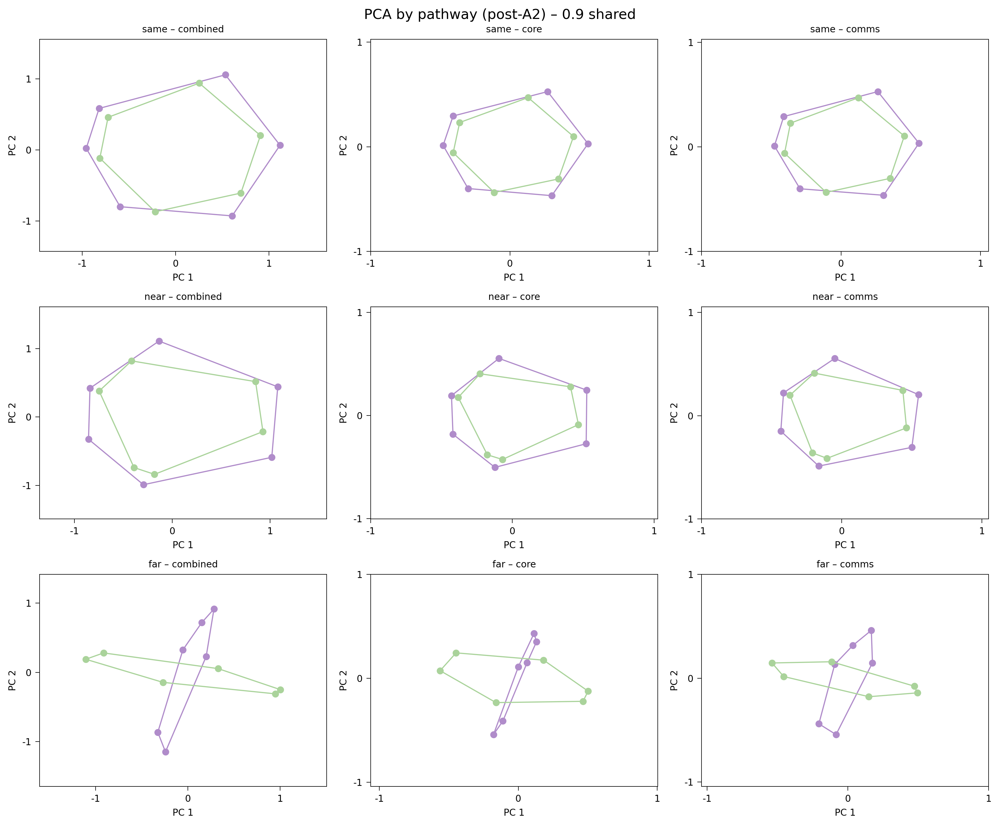

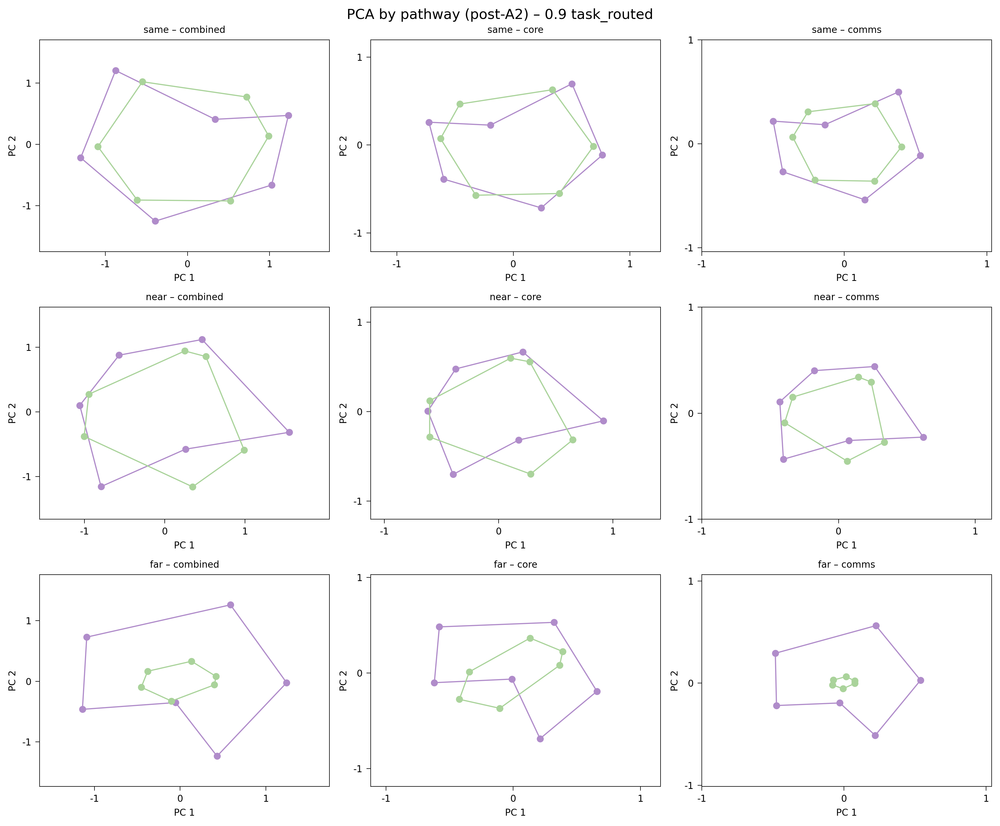

In [10]:
# 10. PCA by pathway (combined vs core vs comms): 3×3 grid per run

pathways = ["combined", "core", "comms"]
for run_id in run_labels:
    bundle = all_ann_data[run_id]
    ann_data = bundle["data"]
    sp_label = bundle["sparsity_label"]
    routing = bundle["input_routing"]

    fig, axes = plt.subplots(3, 3, figsize=(12, 10))
    fig.suptitle(f"PCA by pathway (post-A2) – {sp_label} {routing}", fontsize=12)

    for row, cond in enumerate(["same", "near", "far"]):
        entries = ann_data.get(cond, [])
        for col, path in enumerate(pathways):
            ax = axes[row, col]
            if not entries:
                ax.set_title(f"{cond} {path}\n(no data)")
                ax.axis("off")
                continue
            try:
                hids = ann._get_last_step_geometry_hids(entries[0], phase_idx, path=path)
            except (KeyError, ValueError):
                ax.set_title(f"{cond} {path}\n(no data)")
                ax.axis("off")
                continue
            hids = np.asarray(hids)[:n_stim_plot]
            if hids.shape[0] < n_stim_plot:
                ax.axis("off")
                continue
            _, X2 = prepare_pca_single_task(hids)
            lims = get_axis_limits(X2)
            plot_split_stim(ax, X2, task_colours, lims)
            ax.set_title(f"{cond} – {path}")
    plt.tight_layout()
    plt.show()

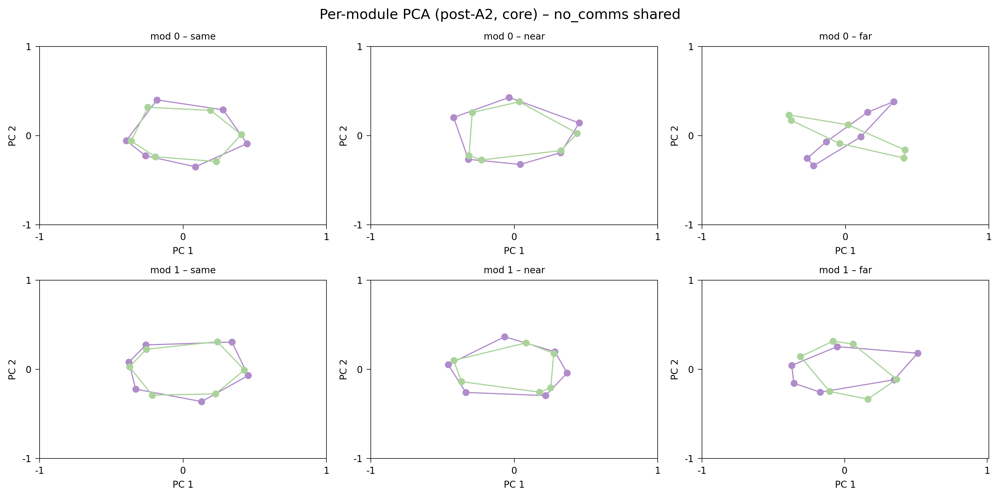

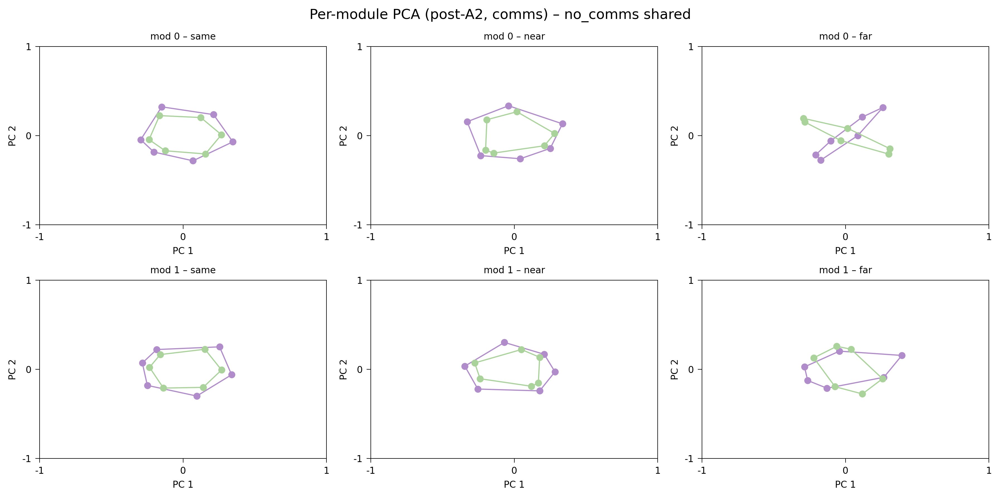

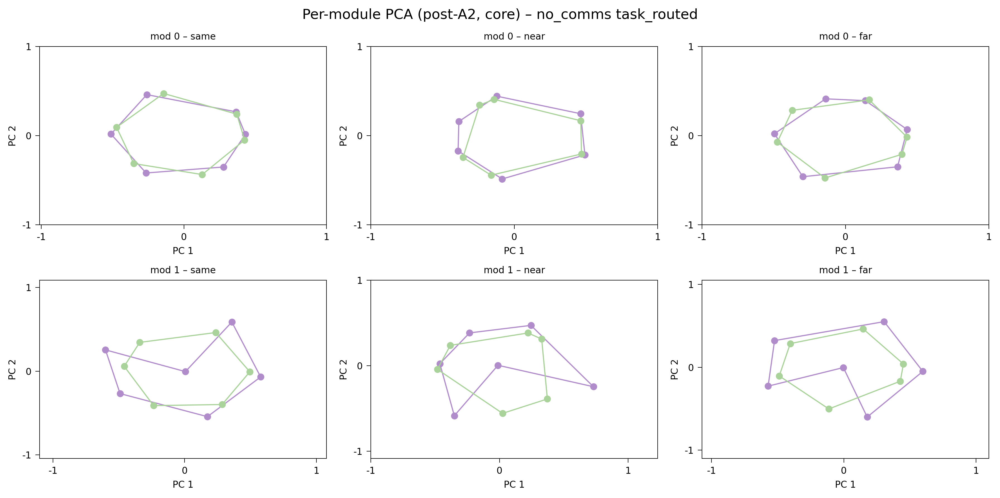

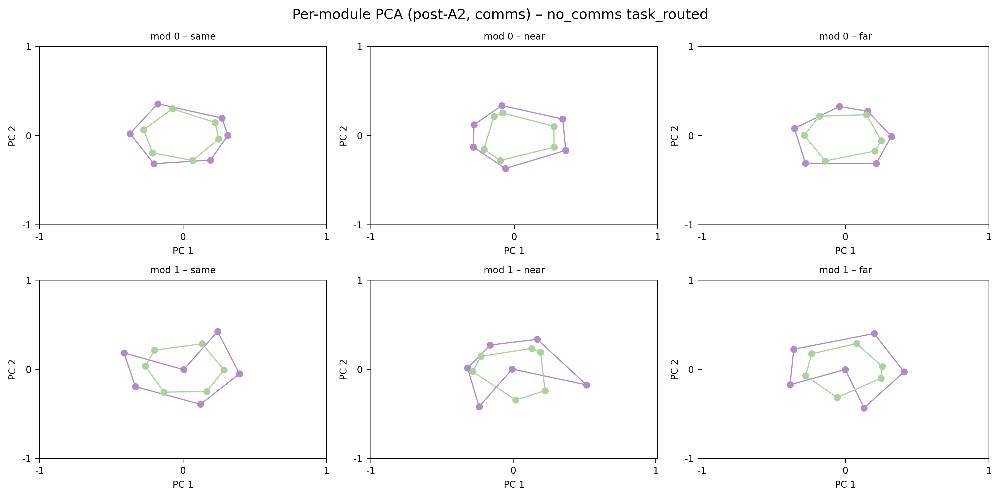

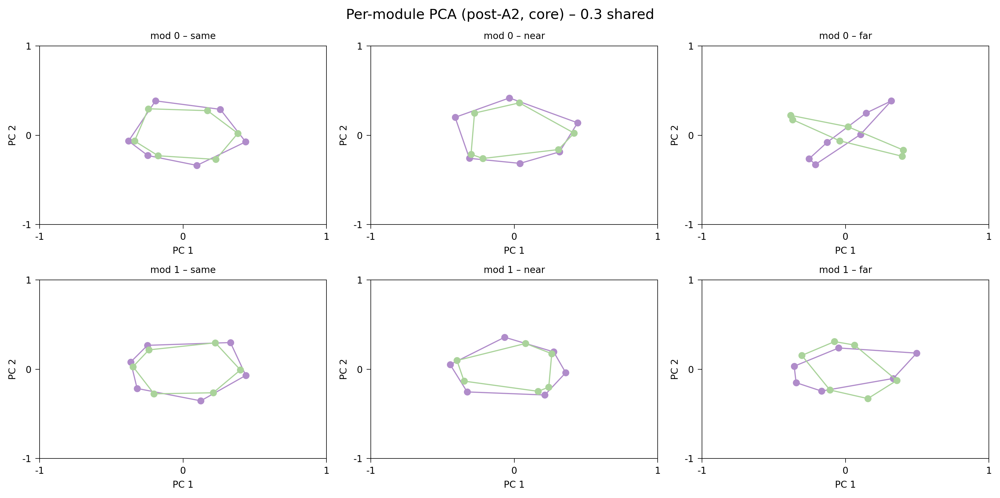

...

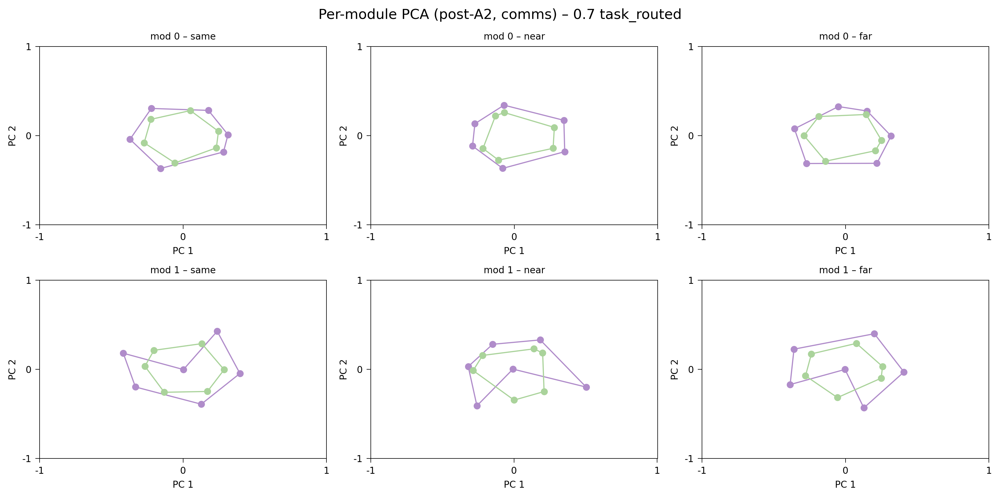

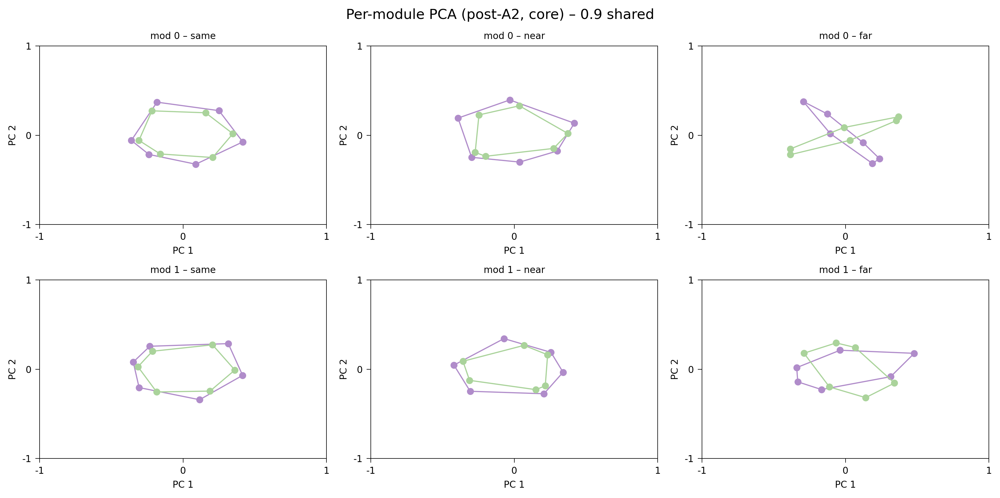

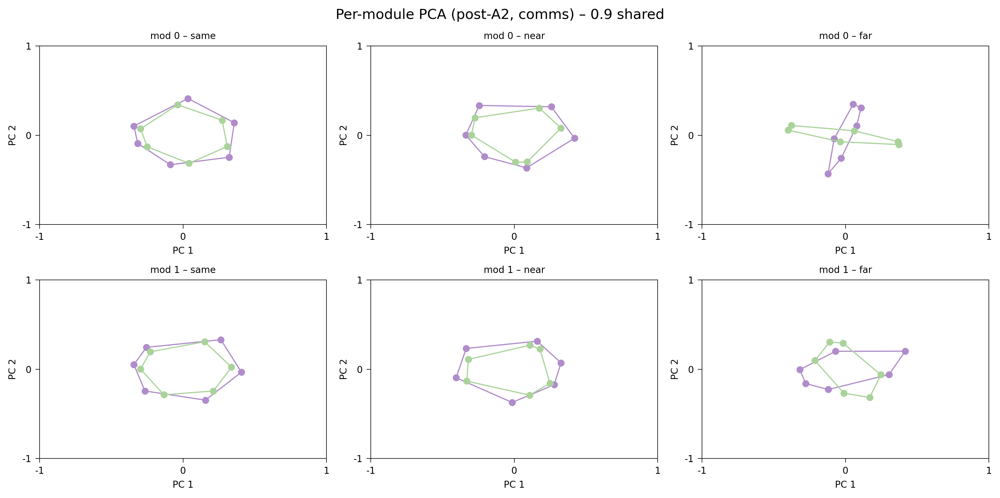

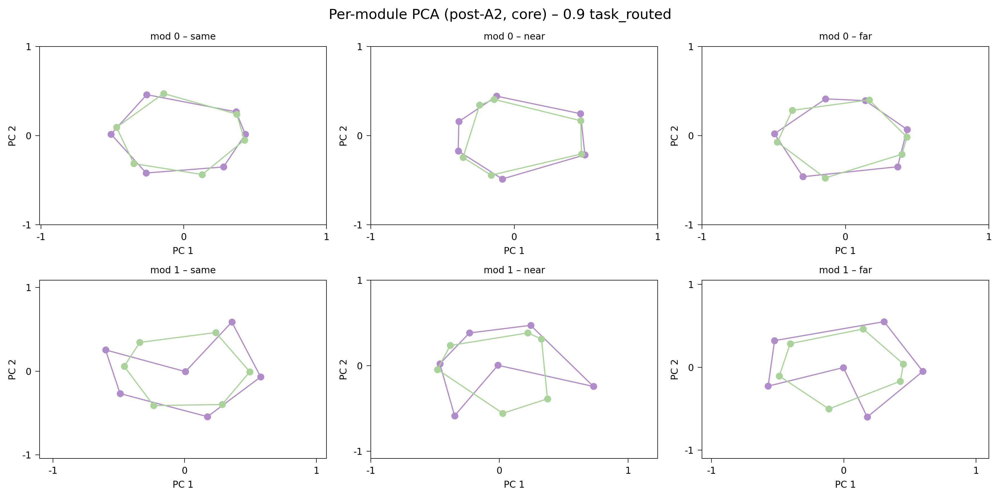

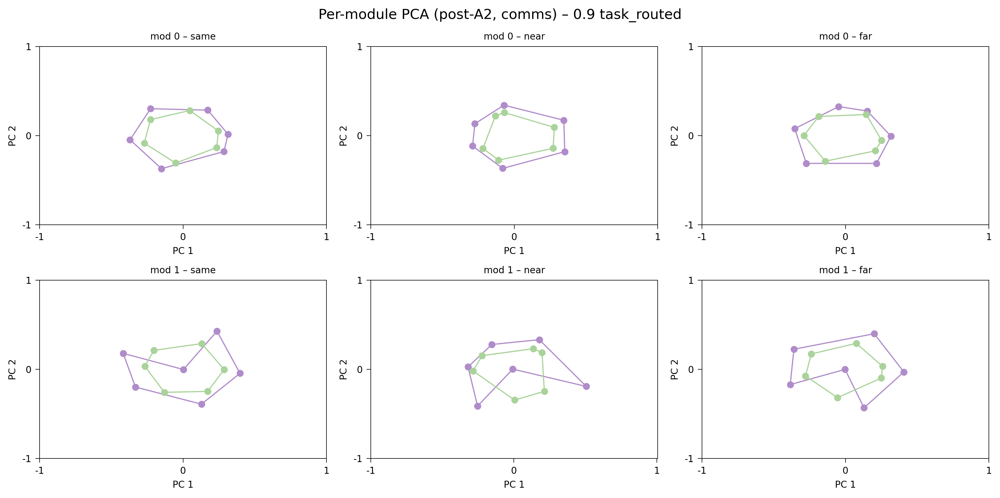

In [11]:
# Per-module PCA geometry (post-A2): core/comms per module

phase_idx = 2
n_stim_plot = 12

for run_id in run_labels:
    bundle = all_ann_data[run_id]
    ann_data = bundle["data"]
    sp_label = bundle["sparsity_label"]
    routing = bundle["input_routing"]

    # Try to infer number of modules from one entry (core_per_module)
    example = None
    for cond in ["same", "near", "far"]:
        entries = ann_data.get(cond, [])
        if entries:
            example = entries[0]
            break
    if example is None:
        continue

    core_key = f"hiddens_post_phase_{phase_idx}_core_per_module"
    if core_key not in example:
        # No per-module core/comms saved for this run
        continue
    core_arr = example[core_key]
    core_arr = np.asarray(core_arr)
    if core_arr.ndim != 3:
        continue
    n_mod = core_arr.shape[1]

    for path in ["core", "comms"]:
        fig, axes = plt.subplots(n_mod, 3, figsize=(12, 3 * n_mod))
        fig.suptitle(f"Per-module PCA (post-A2, {path}) – {sp_label} {routing}", fontsize=12)

        # axes may be 1D if n_mod==1
        if n_mod == 1:
            axes = np.expand_dims(axes, 0)

        for m in range(n_mod):
            for col, cond in enumerate(["same", "near", "far"]):
                ax = axes[m, col]
                entries = ann_data.get(cond, [])
                if not entries:
                    ax.set_title(f"mod {m} {cond}\n(no data)")
                    ax.axis("off")
                    continue
                entry = entries[0]
                key = f"hiddens_post_phase_{phase_idx}_{path}_per_module"
                if key not in entry:
                    ax.set_title(f"mod {m} {cond}\n(no {path}_per_module)")
                    ax.axis("off")
                    continue
                arr = np.asarray(entry[key])
                if arr.ndim != 3 or arr.shape[1] <= m:
                    ax.axis("off")
                    continue
                hids = arr[:, m, :]
                if hids.shape[0] < n_stim_plot:
                    ax.axis("off")
                    continue
                hids = hids[:n_stim_plot]
                _, X2 = prepare_pca_single_task(hids)
                lims = get_axis_limits(X2)
                plot_split_stim(ax, X2, task_colours, lims)
                ax.set_title(f"mod {m} – {cond}")
        plt.tight_layout()
        plt.show()


## 11. Summary

Use the tables and plots above to compare:
- **Transfer:** How does error_diff vary with sparsity and shared vs task_routed?
- **Accuracy & loss:** Which configurations reach good final accuracy and low loss?
- **Geometry:** How does dimensionality (and 2D layout) change with sparsity and routing for init_scale=0.1?